In [1]:
from os import listdir
from os.path import isfile, join
import json
import os
import time
import matplotlib.pyplot as plt 
import pandas as pd
import subprocess

import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt
import torchvision
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from torchvision import transforms
import numpy as np
import tqdm
from PIL import Image
import pickle

import warnings
warnings.filterwarnings("ignore")

from collections import Counter
from copy import deepcopy
from collections import OrderedDict

In [2]:
%matplotlib inline

In [3]:
project_path = '' #'drive/My Drive/InstaDump'

train_jsons = join(project_path, "small_train_jsons")
val_jsons = join(project_path, "small_val_jsons")
photos_for_train = join(project_path, 'photos_for_train')

models_path = join(project_path, 'models_path')

photos_for_train

'photos_for_train'

In [4]:
checked_username = [a[:-5] for a in listdir(train_jsons)]
checked_username[:3], len(checked_username)

(['n0v1_74n', 'vibrationoflight', 'liliannastina'], 762)

In [5]:
with open(join(project_path, "tag2idx_small.json"), 'r') as f:
    tag2idx = json.loads(f.read()) 

idx2tag = {}

for k, v in tag2idx.items():
    idx2tag[v] = k

len(tag2idx.keys())

152

In [6]:
idx2tag = {}

for t, i in tag2idx.items():
    idx2tag[i] = t

In [7]:
local_path = photos_for_train

In [8]:
import torch
from torch.utils.data import Dataset as TorchDataset

class Dataset(TorchDataset):
    
    """Custom data.Dataset compatible with data.DataLoader."""
    def __init__(self, tags, photos_dir_list, transform = None, main_photo_dir = local_path, n_tags = 152):
        self.tags = tags
        self.photos_dir_list = photos_dir_list
        self.main_photo_dir = main_photo_dir
        self.transform = transform
        self.n_tags = n_tags

    def __getitem__(self, idx):
        # loading image by its path
        img = Image.open(join(self.main_photo_dir, self.photos_dir_list[idx]))
        img = img.convert('RGB')
        # applying transformation
        if self.transform is not None:
            img = self.transform(img)
        img = img.numpy()

        # label = torch.from_numpy(self.y[idx])
        label = np.zeros(self.n_tags)
        label[self.tags[idx]] = 1.
        
        # returning image and its class
        return img.astype('float32'), label
        # return img, label

    def __len__(self):
        return len(self.photos_dir_list)

In [9]:
saved_users_part1 = deepcopy(checked_username)[:300]
saved_users_part2 = deepcopy(checked_username)[300:600]
saved_users_part3 = deepcopy(checked_username)[600:]

len(saved_users_part1), len(saved_users_part2), len(saved_users_part3)

(300, 300, 162)

In [10]:
# preparation

batch_size_for_all = 128

means = np.array([0.485, 0.456, 0.406])
stds = np.array([0.229, 0.224, 0.225])

input_size = 224

# data transformations    
data_transform = transforms.Compose([
    transforms.RandomRotation([-15, 15]),
    transforms.ColorJitter(),
    transforms.RandomResizedCrop(input_size, scale=(0.8, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=2),
    transforms.RandomHorizontalFlip(),
    transforms.Resize((input_size,input_size)),
    # transforms.RandomResizedCrop(input_size),
    transforms.ToTensor(),
    transforms.Normalize(means, stds)
])

val_transform = transforms.Compose([
    transforms.Resize((input_size, input_size)),
    # transforms.Resize(input_size),
    # transforms.Scale(input_size),
    transforms.ToTensor(),
    transforms.Normalize(means, stds)
])

class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        new_tensor = deepcopy(tensor)
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor
    
unorm = UnNormalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))

In [11]:
%%time
# train
name = saved_users_part1[1]

with open(f'{train_jsons}/{name}.json', 'r') as f:
    username_json = json.loads(f.read())

train_user_dataset_1 = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = data_transform)

for name in tqdm.tqdm(saved_users_part1[2:]):

    with open(f'{train_jsons}/{name}.json', 'r') as f:
        username_json = json.loads(f.read())

    new_user_dataset = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = data_transform)


    train_user_dataset_1 = ConcatDataset([new_user_dataset, train_user_dataset_1])

# valid
name = saved_users_part1[1]

with open(f'{val_jsons}/{name}.json', 'r') as f:
    username_json = json.loads(f.read())

val_user_dataset_1 = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = val_transform)

for name in tqdm.tqdm(saved_users_part1[2:]):

    with open(f'{val_jsons}/{name}.json', 'r') as f:
        username_json = json.loads(f.read())

    new_user_dataset = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = val_transform)


    val_user_dataset_1 = ConcatDataset([new_user_dataset, val_user_dataset_1])


train_loader_1 = DataLoader(train_user_dataset_1, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 
val_loader_1 = DataLoader(val_user_dataset_1, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 

100%|██████████| 298/298 [00:00<00:00, 14938.12it/s]

CPU times: user 144 ms, sys: 19.9 ms, total: 164 ms
Wall time: 162 ms


In [12]:
%%time
# train
name = saved_users_part2[1]

with open(f'{train_jsons}/{name}.json', 'r') as f:
    username_json = json.loads(f.read())

train_user_dataset_2 = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = data_transform)

for name in tqdm.tqdm(saved_users_part2[2:]):

    with open(f'{train_jsons}/{name}.json', 'r') as f:
        username_json = json.loads(f.read())

    new_user_dataset = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = data_transform)


    train_user_dataset_2 = ConcatDataset([new_user_dataset, train_user_dataset_2])

# valid
name = saved_users_part2[1]

with open(f'{val_jsons}/{name}.json', 'r') as f:
    username_json = json.loads(f.read())

val_user_dataset_2 = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = val_transform)

for name in tqdm.tqdm(saved_users_part2[2:]):

    with open(f'{val_jsons}/{name}.json', 'r') as f:
        username_json = json.loads(f.read())

    new_user_dataset = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = val_transform)


    val_user_dataset_2 = ConcatDataset([new_user_dataset, val_user_dataset_2])


train_loader_2 = DataLoader(train_user_dataset_2, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 
val_loader_2 = DataLoader(val_user_dataset_2, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 

100%|██████████| 298/298 [00:00<00:00, 14510.80it/s]

CPU times: user 149 ms, sys: 28.1 ms, total: 177 ms
Wall time: 176 ms


In [13]:
%%time
# train
name = saved_users_part3[1]

with open(f'{train_jsons}/{name}.json', 'r') as f:
    username_json = json.loads(f.read())

train_user_dataset_3 = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = data_transform)

for name in tqdm.tqdm(saved_users_part3[2:]):

    with open(f'{train_jsons}/{name}.json', 'r') as f:
        username_json = json.loads(f.read())

    new_user_dataset = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = data_transform)


    train_user_dataset_3 = ConcatDataset([new_user_dataset, train_user_dataset_3])

# valid
name = saved_users_part3[1]

with open(f'{val_jsons}/{name}.json', 'r') as f:
    username_json = json.loads(f.read())

val_user_dataset_3 = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = val_transform)

for name in tqdm.tqdm(saved_users_part3[2:]):

    with open(f'{val_jsons}/{name}.json', 'r') as f:
        username_json = json.loads(f.read())

    new_user_dataset = Dataset(username_json['tags'], username_json['photo_file_path'], 
                       main_photo_dir = local_path, transform = val_transform)


    val_user_dataset_3 = ConcatDataset([new_user_dataset, val_user_dataset_3])


train_loader_3 = DataLoader(train_user_dataset_3, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 
val_loader_3 = DataLoader(val_user_dataset_3, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 

100%|██████████| 160/160 [00:00<00:00, 2162.26it/s]

CPU times: user 115 ms, sys: 24.3 ms, total: 140 ms
Wall time: 139 ms


In [14]:
train_user_dataset = ConcatDataset([train_user_dataset_1, train_user_dataset_2])
train_user_dataset = ConcatDataset([train_user_dataset, train_user_dataset_3])
val_user_dataset = ConcatDataset([val_user_dataset_1, val_user_dataset_2])
val_user_dataset = ConcatDataset([val_user_dataset, val_user_dataset_3])


train_loader = DataLoader(train_user_dataset, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 
val_loader = DataLoader(val_user_dataset, batch_size = batch_size_for_all,  num_workers=32, shuffle=True) 

In [15]:
# just a function for visualization
def draw_samples(samples, labels, n = 8):
    counter = 1
    cols = 8
    rows = n/cols
    plt.figure(figsize=(12,rows*2))

    for lab, sample in zip(labels,samples):

        plt.subplot(rows,cols,counter)

        s = deepcopy(sample)
        s = unorm(s)
        
        image_to_plot = np.clip(np.transpose(s.cpu().detach().numpy(),[1,2,0]), 0.,1.) 
        
        fig= plt.imshow(image_to_plot)
        
        fig.axes.get_xaxis().set_visible(False) # for removing axis
        fig.axes.get_yaxis().set_visible(False) # for removing axis
        
        counter +=1
        if counter > n:
            plt.show()
            break

labels.shape: torch.Size([128, 152])
samples.shape: torch.Size([128, 3, 224, 224])


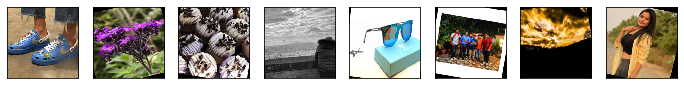

labels.shape: torch.Size([128, 152])
samples.shape: torch.Size([128, 3, 224, 224])


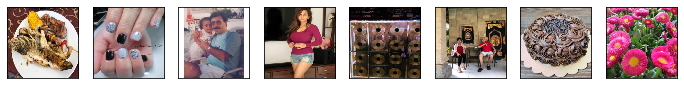

In [16]:
for loader in [train_loader, val_loader]:
    
    samples, labels = iter(loader).next()

    print(f"labels.shape: {labels.shape}")
    print(f"samples.shape: {samples.shape}")

    draw_samples(samples, labels)

In [17]:
model_resnext = torch.hub.load('facebookresearch/semi-supervised-ImageNet1K-models', 'resnext101_32x8d_swsl')

Using cache found in /home/ubuntu/.cache/torch/hub/facebookresearch_semi-supervised-ImageNet1K-models_master


In [18]:
USE_GPU = True

dtype = torch.float32 # we will be using float throughout this tutorial

if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

print('using device:', device)

using device: cuda


In [19]:
model = deepcopy(model_resnext)
# model.aux_logits = False

num_classes = 152 # Number of classes in the dataset

for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features

# model.aux_logits = False
# model.AuxLogits.fc = nn.Linear(768, num_classes)

inner_layer_neurons = 512

model.fc = nn.Sequential(OrderedDict([
    ('fc1', nn.Linear(num_ftrs, inner_layer_neurons)),
    ('bn1', nn.BatchNorm1d(num_features=inner_layer_neurons)),
    ('relu', nn.LeakyReLU()),
    ('fc2', nn.Linear(inner_layer_neurons,num_classes)),
]))

model = model.to(device=device)

params_to_update = model.parameters()
print("Params to learn:")

params_to_update = []
for name, param in model.named_parameters():
    if param.requires_grad == True:
        params_to_update.append(param)
        print("\t",name)

# len(params_to_update)

Params to learn:
	 fc.fc1.weight
	 fc.fc1.bias
	 fc.bn1.weight
	 fc.bn1.bias
	 fc.fc2.weight
	 fc.fc2.bias


In [20]:
%%time
samples, labels = iter(val_loader).next()

print(f"labels.shape: {labels.shape}")
print(f"samples.shape: {samples.shape}")

samples_to_pred = deepcopy(samples)
samples_to_plot = unorm(deepcopy(samples_to_pred))

samples_to_pred = samples_to_pred.to(device=device)  # move to device, e.g. GPU

labels.shape: torch.Size([128, 152])
samples.shape: torch.Size([128, 3, 224, 224])
CPU times: user 215 ms, sys: 1.35 s, total: 1.56 s
Wall time: 3.42 s


In [21]:
labels[0].shape

torch.Size([152])

In [22]:
def show_preds_with_images(model, samples_to_pred=samples_to_pred, 
                           samples_to_plot=samples_to_plot,labels=labels):
    model.eval()
    output = model(samples_to_pred)
    
    counter = 1
    cols = 4
    rows = 2
    plt.figure(figsize=(24,rows*5.5))
    
    k = 5

    for photo_ind in range(8):
        labs = labels.cpu().detach().numpy()[photo_ind] 
        true_labels = np.arange(len(labs))[labs == 1] 

        top_5 = np.argsort(output.cpu().detach().numpy()[photo_ind])[:-6:-1]
        intersection = min(k, len(set(top_5) & set(true_labels)))

        precision_k = intersection / k
        recall_k = intersection / len(true_labels)

        plt.subplot(rows,cols,counter)
    
        image_to_plot = np.clip(np.transpose(samples_to_plot.cpu().detach().numpy()[photo_ind],[1,2,0]), 0.,1.) 
    
        fig= plt.imshow(image_to_plot)
        
        title = "True: "+', '.join([idx2tag[ind] for ind in true_labels]) + '\n'+\
                "Top5: "+', '.join([idx2tag[ind] for ind in top_5])+'\n' +\
                f'Precision@k= {round(precision_k, 4)}, Recall@k= {round(recall_k, 4)}'
        plt.title(title)
        fig.axes.get_xaxis().set_visible(False) # for removing axis
        fig.axes.get_yaxis().set_visible(False)
        
        counter +=1
        
    plt.show()

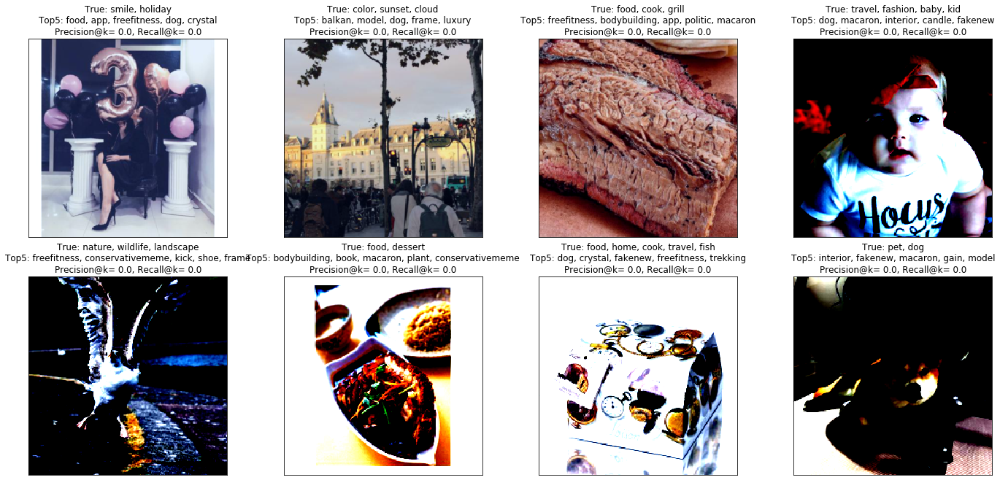

In [23]:
show_preds_with_images(model)

In [24]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=2e-3)

from torch.optim.lr_scheduler import StepLR

# gamma = decaying factor
scheduler = StepLR(optimizer, step_size=3, gamma=0.05)

 ------------------------------------------------------------- 
Epoch: 0

	Train Loss: 0.0640(std:0.0223), 	precision: 0.6140(std:0.3502), 	recall: 0.5820(std:0.3457)
	Val Loss: 0.0594(std:0.0044), 	precision: 0.6551(std:0.3279), 	recall: 0.6151(std:0.3256)
	Took time: 3358.65


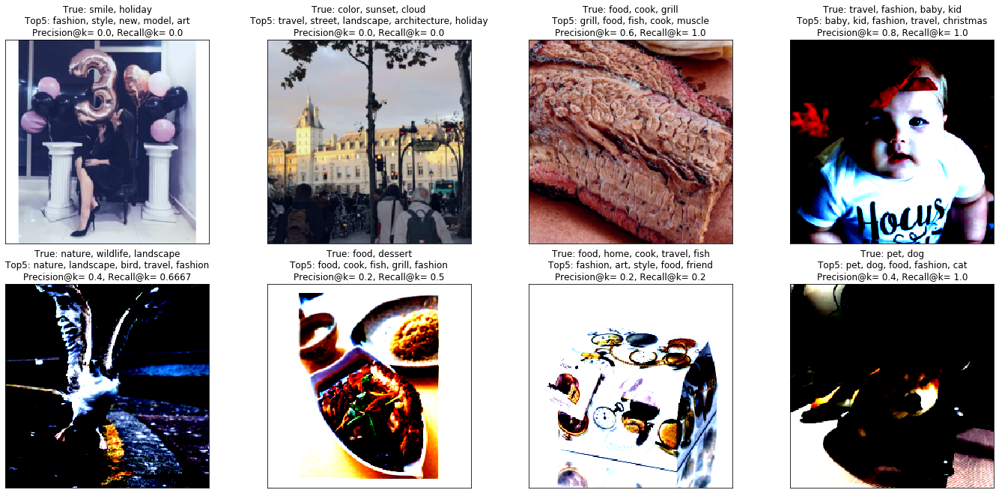

 
 ------------------------------------------------------------- 
Epoch: 1

	Train Loss: 0.0571(std:0.0040), 	precision: 0.6482(std:0.3486), 	recall: 0.6158(std:0.3467)
	Val Loss: 0.0564(std:0.0041), 	precision: 0.7043(std:0.3412), 	recall: 0.6756(std:0.3376)
	Took time: 3372.60


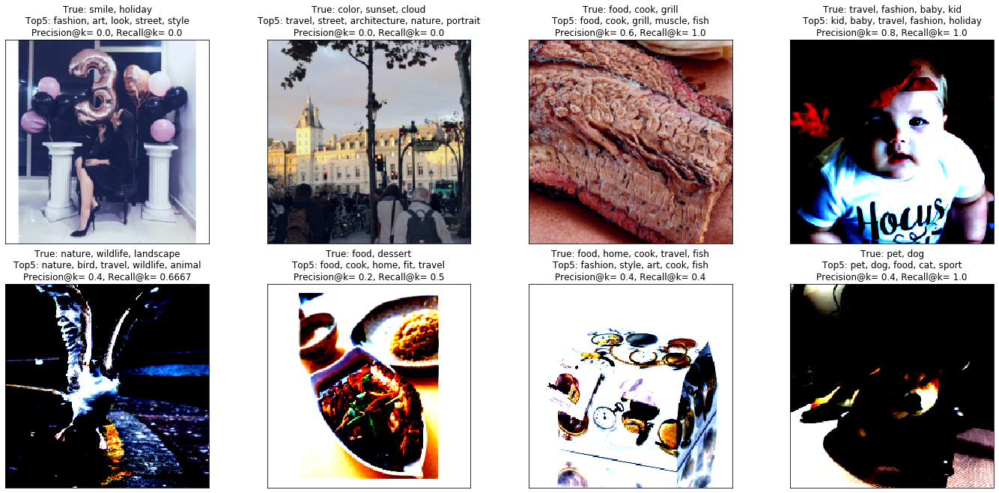

 
 ------------------------------------------------------------- 
Epoch: 2


In [ ]:
# 2e

model_name = 'resnext_4'

train_loss_list = []
train_precision_k_list = []
train_recall_k_list = []

val_loss_list = []
val_precision_k_list = []
val_recall_k_list = []

k = 5

for epoch in range(50):
    print(' ------------------------------------------------------------- ')
    print(f'Epoch: {epoch}')
    start_time = time.time()
    model.train()
    inner_train_loss_list = []
    inner_precision_k_list = []
    inner_recall_k_list = []

    for X, y in train_loader:
        
        X = X.to(device=device)  # move to device, e.g. GPU
        y = y.to(device=device)

        optimizer.zero_grad()

        output = model(X)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()
        inner_train_loss_list.append(loss.item())


        labels = y.cpu().detach().numpy()[0] 
        true_labels = np.arange(len(labels))[labels == 1]
        n_true = len(true_labels)

        top_5 = np.argsort(output.cpu().detach().numpy()[0])[:-6:-1]
        intersection = min(k, len(set(top_5) & set(true_labels)))

        precision_k = intersection / min(k, n_true)
        recall_k = intersection / n_true

        inner_precision_k_list.append(precision_k)
        inner_recall_k_list.append(recall_k)

    train_loss_mean = np.mean(inner_train_loss_list)
    precision_mean = np.mean(inner_precision_k_list)
    recall_mean = np.mean(inner_recall_k_list)

    train_loss_std = np.std(inner_train_loss_list)
    precision_std = np.std(inner_precision_k_list)
    recall_std = np.std(inner_recall_k_list)
    
    print('\n\tTrain Loss: {:.4f}(std:{:.4f}), \tprecision: {:.4f}(std:{:.4f}), \trecall: {:.4f}(std:{:.4f})'.format(train_loss_mean, train_loss_std,
                                                                                                                   precision_mean, precision_std,
                                                                                                                   recall_mean, recall_std))
    train_loss_list.append(train_loss_mean)
    train_precision_k_list.append(precision_mean)
    train_recall_k_list.append(recall_mean)
    train_time = time.time()

    scheduler.step()
    
    # validation
    model.eval()
    inner_val_loss_list = []
    inner_precision_k_list = []
    inner_recall_k_list = []

    for X, y in val_loader:
        X = X.to(device=device)  # move to device, e.g. GPU
        y = y.to(device=device)

        output = model(X)
        loss = criterion(output, y)
    
        inner_val_loss_list.append(loss.item())

        labels = y.cpu().detach().numpy()[0] 
        true_labels = np.arange(len(labels))[labels == 1]

        top_5 = np.argsort(output.cpu().detach().numpy()[0])[:-6:-1]
        intersection = min(k, len(set(top_5) & set(true_labels)))
        n_true = len(true_labels)

        precision_k = intersection / min(k, n_true)
        recall_k = intersection / n_true

        inner_precision_k_list.append(precision_k)
        inner_recall_k_list.append(recall_k)

    val_loss_mean = np.mean(inner_val_loss_list)
    precision_mean = np.mean(inner_precision_k_list)
    recall_mean = np.mean(inner_recall_k_list)

    val_loss_std = np.std(inner_val_loss_list)
    precision_std = np.std(inner_precision_k_list)
    recall_std = np.std(inner_recall_k_list)

    val_loss_mean = np.mean(inner_val_loss_list)
    print('\tVal Loss: {:.4f}(std:{:.4f}), \tprecision: {:.4f}(std:{:.4f}), \trecall: {:.4f}(std:{:.4f})'.format(val_loss_mean, val_loss_std, 
                                                                                                                 precision_mean, precision_std,
                                                                                                                 recall_mean, recall_std))
    # print('\tVal Loss: {:.4f}'.format(train_loss_mean))
    val_precision_k_list.append(precision_mean)
    val_recall_k_list.append(recall_mean)
    val_loss_list.append(val_loss_mean)
    
#     if (recall_mean >= 0.5) | (precision_mean >= 0.5):
    torch.save(model, join(models_path, f"{model_name}_{epoch}epoch_{round(precision_mean,4)}prec_{round(recall_mean,4)}rec"))

    print('\tTook time: {:.2f}'.format(time.time() - start_time))
    show_preds_with_images(model)
    print(' ')

In [39]:
model = torch.load(join(models_path, 'resnext_2_4epoch_0.3493prec_0.3374rec'))

In [40]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=2e-3)

from torch.optim.lr_scheduler import StepLR

# gamma = decaying factor
scheduler = StepLR(optimizer, step_size=3, gamma=0.05)

 ------------------------------------------------------------- 
Epoch: 5

	Train Loss: 0.6927(std:0.0001), 	precision: 0.3777(std:0.3219), 	recall: 0.3584(std:0.3160)
	Val Loss: 0.6926(std:0.0001), 	precision: 0.3927(std:0.3236), 	recall: 0.3728(std:0.3165)
	Took time: 3368.57


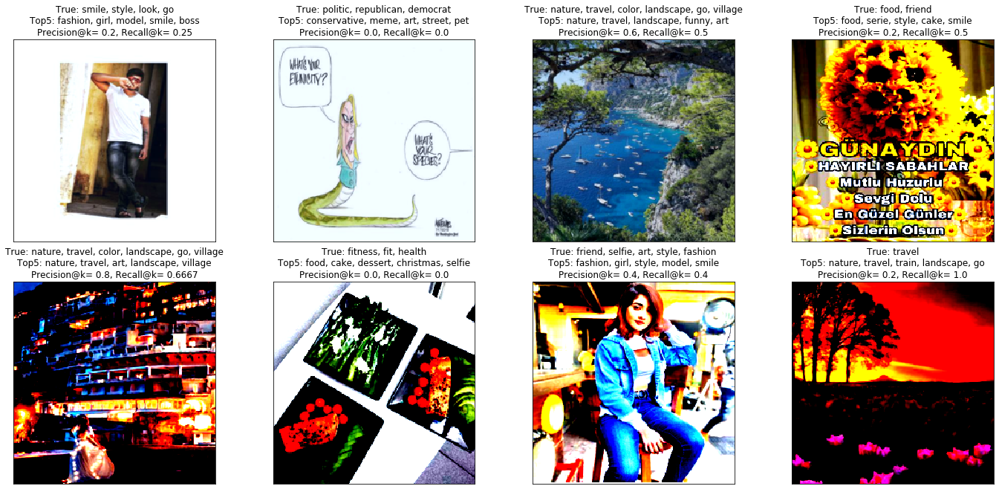

 
 ------------------------------------------------------------- 
Epoch: 6

	Train Loss: 0.6926(std:0.0001), 	precision: 0.3817(std:0.3219), 	recall: 0.3627(std:0.3155)
	Val Loss: 0.6926(std:0.0001), 	precision: 0.4047(std:0.3239), 	recall: 0.3801(std:0.3162)
	Took time: 3385.34


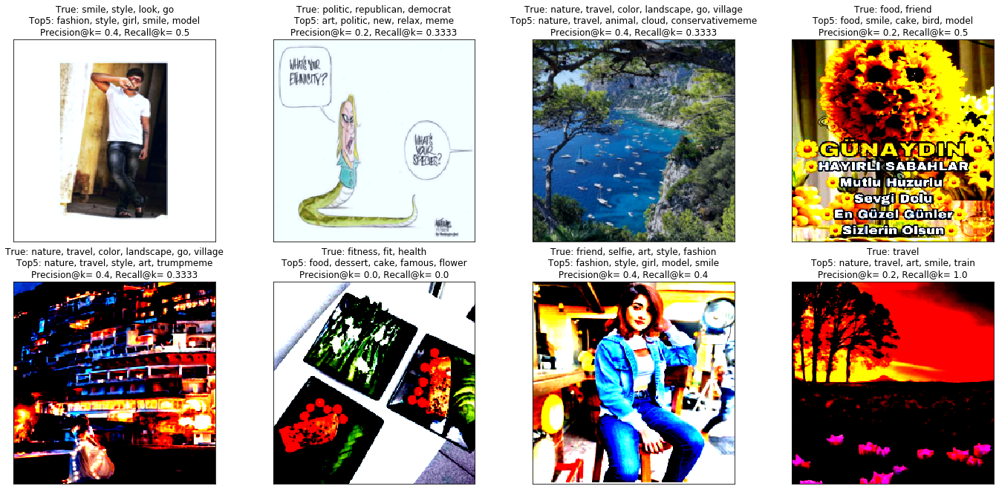

 
 ------------------------------------------------------------- 
Epoch: 7

	Train Loss: 0.6926(std:0.0001), 	precision: 0.3884(std:0.3252), 	recall: 0.3642(std:0.3148)
	Val Loss: 0.6926(std:0.0001), 	precision: 0.3949(std:0.3293), 	recall: 0.3742(std:0.3229)
	Took time: 3387.47


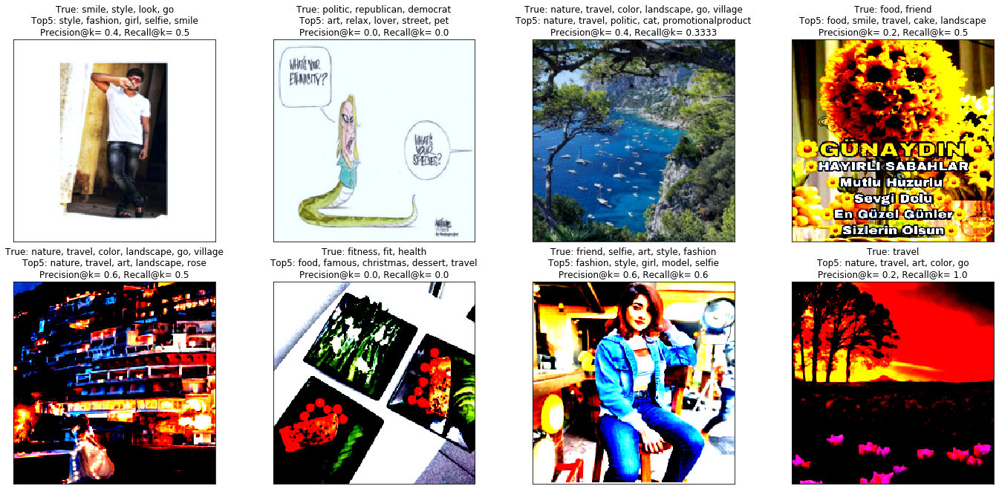

 
 ------------------------------------------------------------- 
Epoch: 8

	Train Loss: 0.6925(std:0.0001), 	precision: 0.3888(std:0.3139), 	recall: 0.3675(std:0.3059)
	Val Loss: 0.6926(std:0.0001), 	precision: 0.4007(std:0.3323), 	recall: 0.3727(std:0.3220)
	Took time: 3385.08


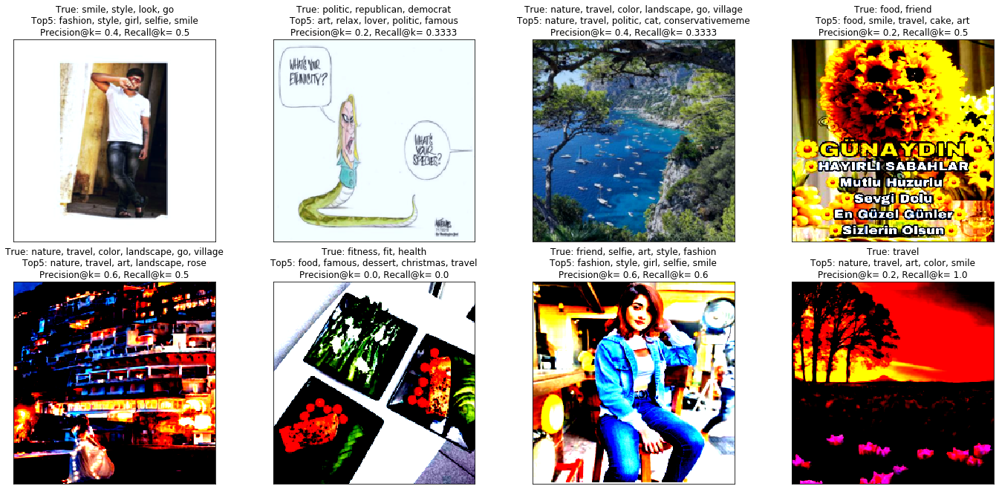

 
 ------------------------------------------------------------- 
Epoch: 9

	Train Loss: 0.6925(std:0.0001), 	precision: 0.4115(std:0.3289), 	recall: 0.3891(std:0.3217)
	Val Loss: 0.6925(std:0.0001), 	precision: 0.3820(std:0.3002), 	recall: 0.3551(std:0.2871)
	Took time: 3382.29


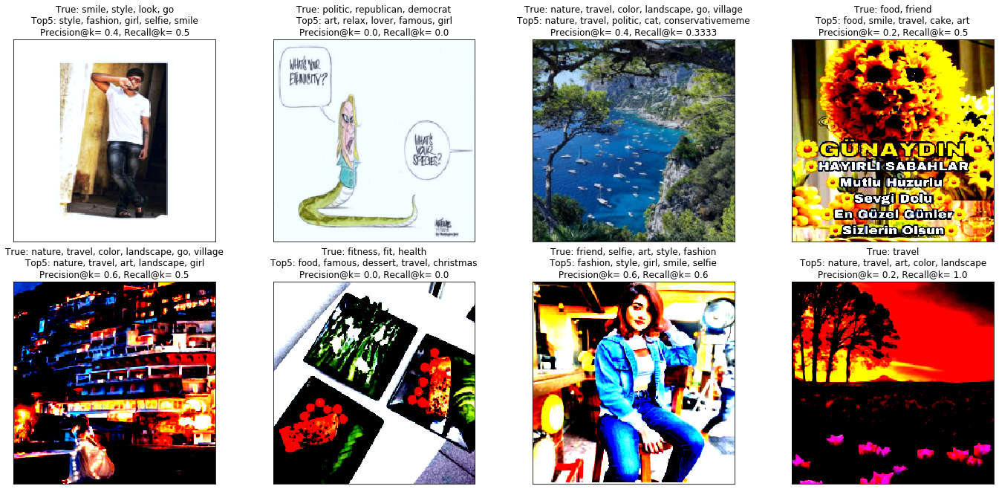

 
 ------------------------------------------------------------- 
Epoch: 10

	Train Loss: 0.6925(std:0.0001), 	precision: 0.3805(std:0.3185), 	recall: 0.3599(std:0.3106)
	Val Loss: 0.6925(std:0.0002), 	precision: 0.3742(std:0.3242), 	recall: 0.3519(std:0.3205)
	Took time: 3350.36


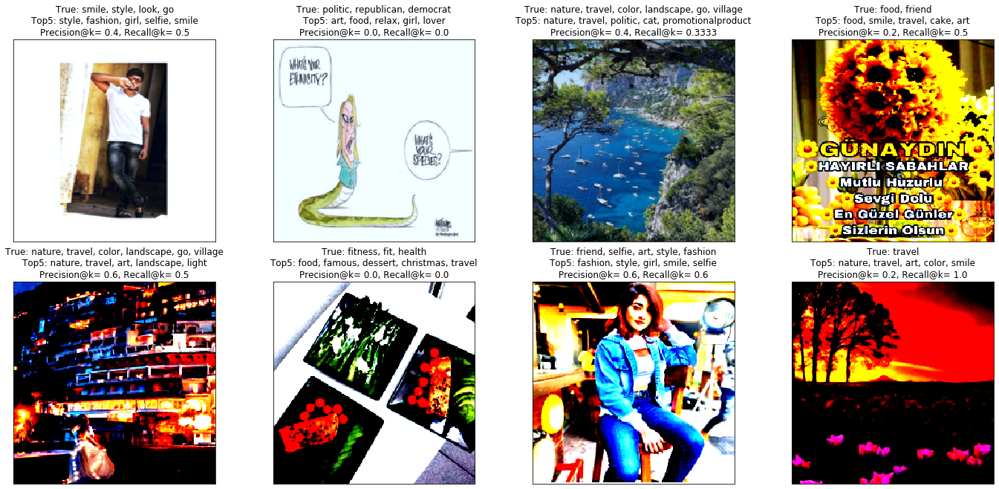

 
 ------------------------------------------------------------- 
Epoch: 11

	Train Loss: 0.6925(std:0.0001), 	precision: 0.3809(std:0.3155), 	recall: 0.3567(std:0.3066)
	Val Loss: 0.6925(std:0.0002), 	precision: 0.3682(std:0.3156), 	recall: 0.3462(std:0.3092)
	Took time: 3384.83


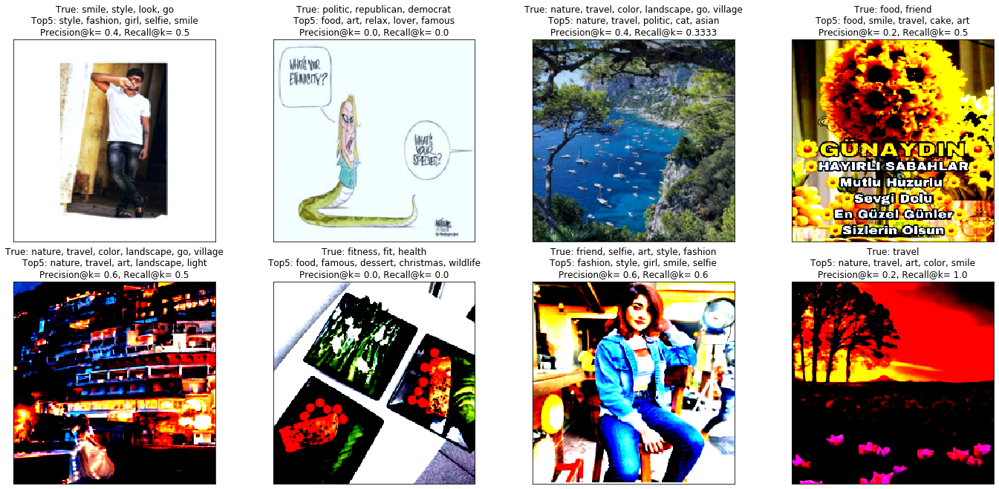

 
 ------------------------------------------------------------- 
Epoch: 12

	Train Loss: 0.6925(std:0.0001), 	precision: 0.3756(std:0.3201), 	recall: 0.3519(std:0.3095)
	Val Loss: 0.6925(std:0.0001), 	precision: 0.3868(std:0.3327), 	recall: 0.3581(std:0.3225)
	Took time: 3385.48


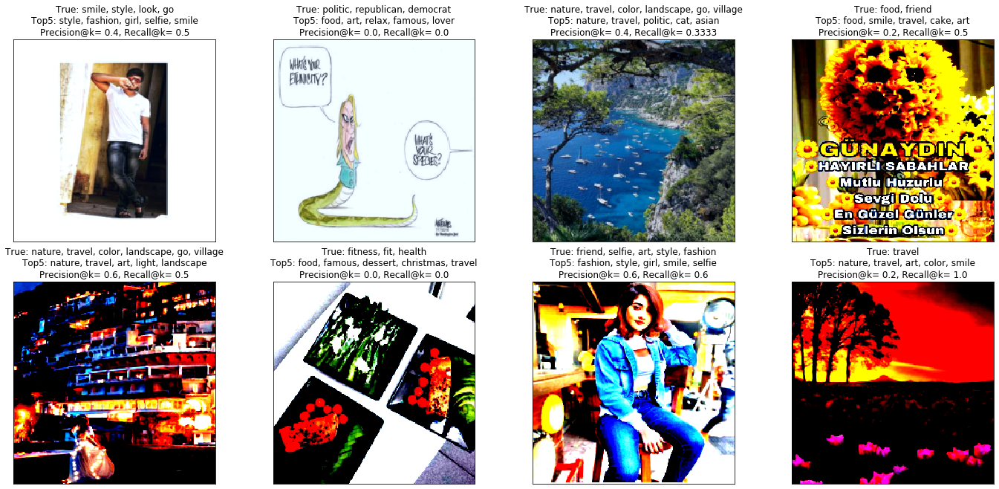

 
 ------------------------------------------------------------- 
Epoch: 13

	Train Loss: 0.6925(std:0.0001), 	precision: 0.3982(std:0.3287), 	recall: 0.3755(std:0.3207)
	Val Loss: 0.6925(std:0.0002), 	precision: 0.3589(std:0.3191), 	recall: 0.3307(std:0.3065)
	Took time: 3392.03


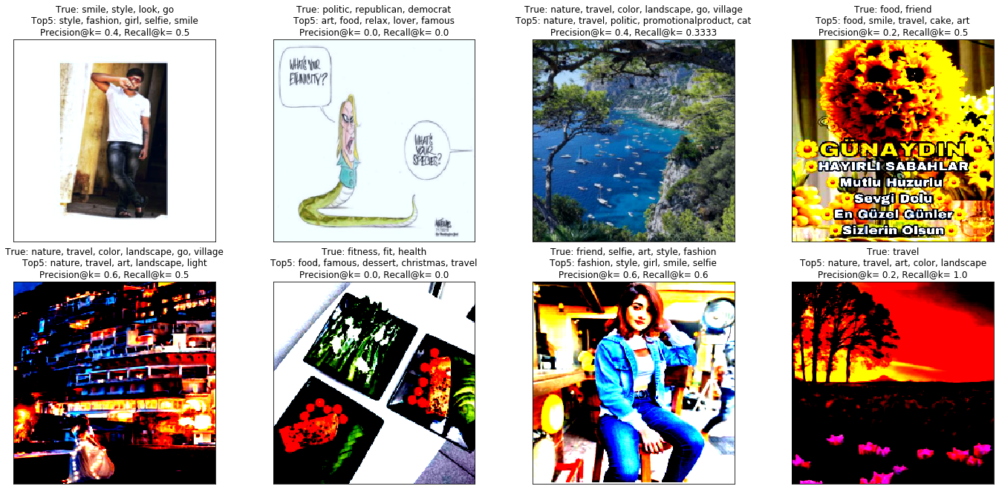

 
 ------------------------------------------------------------- 
Epoch: 14

	Train Loss: 0.6925(std:0.0001), 	precision: 0.3902(std:0.3262), 	recall: 0.3663(std:0.3162)
	Val Loss: 0.6925(std:0.0002), 	precision: 0.3897(std:0.3147), 	recall: 0.3678(std:0.3092)
	Took time: 3407.81


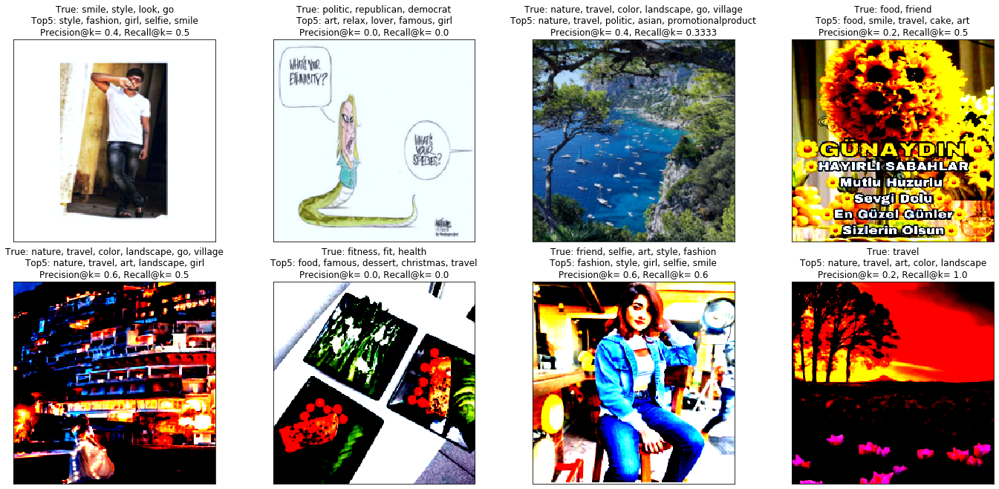

 
 ------------------------------------------------------------- 
Epoch: 15

	Train Loss: 0.6925(std:0.0001), 	precision: 0.3834(std:0.3264), 	recall: 0.3625(std:0.3182)
	Val Loss: 0.6925(std:0.0001), 	precision: 0.3786(std:0.3089), 	recall: 0.3607(std:0.3058)
	Took time: 3379.99


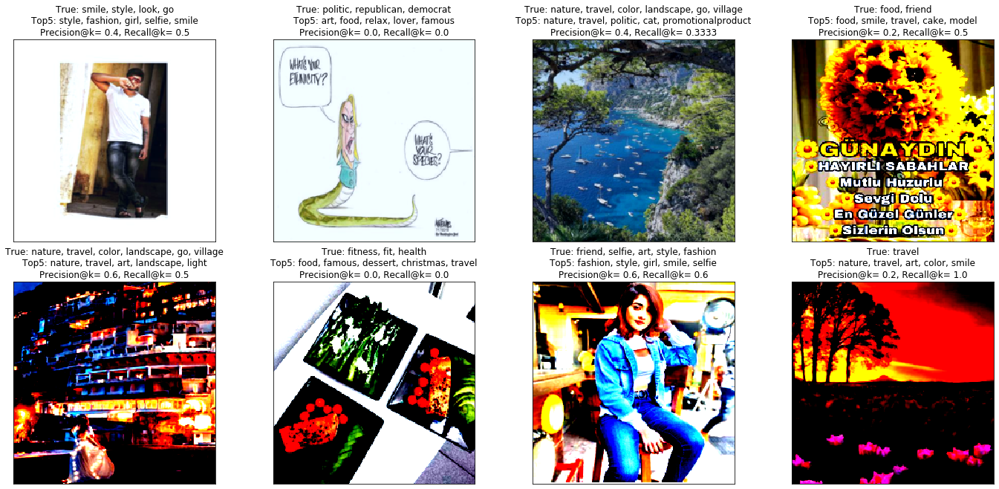

 
 ------------------------------------------------------------- 
Epoch: 16


Traceback (most recent call last):
  File "/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
Traceback (most recent call last):
  File "/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/h

KeyboardInterrupt: 

In [41]:
# continue training

model_name = 'resnext_2'

train_loss_list = []
train_precision_k_list = []
train_recall_k_list = []

val_loss_list = []
val_precision_k_list = []
val_recall_k_list = []

k = 5

for epoch in range(5, 50):
    print(' ------------------------------------------------------------- ')
    print(f'Epoch: {epoch}')
    start_time = time.time()
    model.train()
    inner_train_loss_list = []
    inner_precision_k_list = []
    inner_recall_k_list = []

    for X, y in train_loader:
        
        X = X.to(device=device)  # move to device, e.g. GPU
        y = y.to(device=device)

        optimizer.zero_grad()

        output = model(X)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()
        inner_train_loss_list.append(loss.item())


        labels = y.cpu().detach().numpy()[0] 
        true_labels = np.arange(len(labels))[labels == 1]
        n_true = len(true_labels)

        top_5 = np.argsort(output.cpu().detach().numpy()[0])[:-6:-1]
        intersection = min(k, len(set(top_5) & set(true_labels)))

        precision_k = intersection / min(k, n_true)
        recall_k = intersection / n_true

        inner_precision_k_list.append(precision_k)
        inner_recall_k_list.append(recall_k)

    train_loss_mean = np.mean(inner_train_loss_list)
    precision_mean = np.mean(inner_precision_k_list)
    recall_mean = np.mean(inner_recall_k_list)

    train_loss_std = np.std(inner_train_loss_list)
    precision_std = np.std(inner_precision_k_list)
    recall_std = np.std(inner_recall_k_list)
    
    print('\n\tTrain Loss: {:.4f}(std:{:.4f}), \tprecision: {:.4f}(std:{:.4f}), \trecall: {:.4f}(std:{:.4f})'.format(train_loss_mean, train_loss_std,
                                                                                                                   precision_mean, precision_std,
                                                                                                                   recall_mean, recall_std))
    train_loss_list.append(train_loss_mean)
    train_precision_k_list.append(precision_mean)
    train_recall_k_list.append(recall_mean)
    train_time = time.time()

    scheduler.step()
    
    # validation
    model.eval()
    inner_val_loss_list = []
    inner_precision_k_list = []
    inner_recall_k_list = []

    for X, y in val_loader:
        X = X.to(device=device)  # move to device, e.g. GPU
        y = y.to(device=device)

        output = model(X)
        loss = criterion(output, y)
    
        inner_val_loss_list.append(loss.item())

        labels = y.cpu().detach().numpy()[0] 
        true_labels = np.arange(len(labels))[labels == 1]

        top_5 = np.argsort(output.cpu().detach().numpy()[0])[:-6:-1]
        intersection = min(k, len(set(top_5) & set(true_labels)))
        n_true = len(true_labels)

        precision_k = intersection / min(k, n_true)
        recall_k = intersection / n_true

        inner_precision_k_list.append(precision_k)
        inner_recall_k_list.append(recall_k)

    val_loss_mean = np.mean(inner_val_loss_list)
    precision_mean = np.mean(inner_precision_k_list)
    recall_mean = np.mean(inner_recall_k_list)

    val_loss_std = np.std(inner_val_loss_list)
    precision_std = np.std(inner_precision_k_list)
    recall_std = np.std(inner_recall_k_list)

    val_loss_mean = np.mean(inner_val_loss_list)
    print('\tVal Loss: {:.4f}(std:{:.4f}), \tprecision: {:.4f}(std:{:.4f}), \trecall: {:.4f}(std:{:.4f})'.format(val_loss_mean, val_loss_std, 
                                                                                                                 precision_mean, precision_std,
                                                                                                                 recall_mean, recall_std))
    # print('\tVal Loss: {:.4f}'.format(train_loss_mean))
    val_precision_k_list.append(precision_mean)
    val_recall_k_list.append(recall_mean)
    val_loss_list.append(val_loss_mean)
    
#     if (recall_mean >= 0.5) | (precision_mean >= 0.5):
    torch.save(model, join(models_path, f"{model_name}_{epoch}epoch_{round(precision_mean,4)}prec_{round(recall_mean,4)}rec"))

    print('\tTook time: {:.2f}'.format(time.time() - start_time))
    show_preds_with_images(model)
    print(' ')

In [42]:
train_precision_k_list, val_precision_k_list

([0.37769092542677446,
  0.38172506738544476,
  0.38835579514824803,
  0.38884097035040427,
  0.4115094339622641,
  0.38052111410601985,
  0.3808715184186882,
  0.37558849955076373,
  0.39821203953279427,
  0.39022461814914644,
  0.3833602875112309],
 [0.3927287581699347,
  0.40465686274509804,
  0.39485294117647063,
  0.40065359477124174,
  0.3820261437908497,
  0.3741830065359477,
  0.36821895424836604,
  0.3868464052287582,
  0.35890522875816994,
  0.3897058823529412,
  0.37859477124183016])

In [43]:
train_recall_k_list, val_recall_k_list

([0.35836534385051905,
  0.3627148652485579,
  0.3641645760648456,
  0.3675218686674212,
  0.38906121282132067,
  0.3598563805167579,
  0.35669165665122543,
  0.351915866403737,
  0.37552525491878586,
  0.3663082305535136,
  0.3625127089143262],
 [0.37279836176895004,
  0.38008551905610727,
  0.3742406558583029,
  0.3726664403134991,
  0.35508887898593783,
  0.35192011147893504,
  0.3461714483773307,
  0.3581416404945817,
  0.33070781342840166,
  0.3677779192485075,
  0.36065486800780916])

In [44]:
train_precision_k_list.extend([0.3849, 0.3672, 0.3572, 0.3465, 0.3618])
train_recall_k_list.extend([0.3662, 0.3489, 0.3399, 0.3298, 0.3464])
val_precision_k_list.extend([0.3792, 0.3363, 0.3383, 0.3548, 0.3493])
val_recall_k_list.extend([0.3637, 0.3159, 0.3249, 0.3380, 0.3374])

In [45]:
import seaborn as sns

In [51]:
# from Notebook 'training_inception'

train_precision_k_list_inception = [0.29320754716981134, 0.2710062893081761, 0.26696316262354, 0.26221024258760106, 
                                  0.27285714285714285, 0.2771967654986523, 0.2765049415992812, 0.2690925426774483, 
                                  0.2667026055705301, 0.2582210242587601, 0.26761006289308176, 0.27335130278526504, 
                                  0.26403414195867025, 0.2764869721473496, 0.26966756513926327, 0.2642048517520216, 
                                  0.2671967654986523, 0.2598472596585804, 0.2632704402515723, 0.2679155435759209]
val_precision_k_list_inception = [0.32107843137254904, 0.28782679738562095, 0.2958333333333333, 0.2919934640522876, 
                                0.35612745098039217, 0.29754901960784313, 0.2752450980392157, 0.3035947712418301, 
                                0.31380718954248366, 0.32066993464052285, 0.2999183006535948, 0.3194444444444445, 
                                0.3148692810457516, 0.29934640522875816, 0.26552287581699346, 0.3064542483660131, 
                                0.3587418300653595, 0.3265522875816994, 0.28545751633986927, 0.3064542483660131]

train_recall_k_list_inception = [0.27768603663482366, 0.25908351905656485, 0.2556548153852736, 0.24933966153642703, 
                               0.26098007413371294, 0.26517524105125184, 0.2641127096922245, 0.256455331131881, 
                               0.2542340423876812, 0.24624401504455415, 0.2554311696090672, 0.26063474560779143, 
                               0.2513341345686359, 0.26290712282626033, 0.25703782141787535, 0.2521487497228737, 
                               0.2560222556718514, 0.2470987503062975, 0.25172504793798595, 0.2549434856847255] 
val_recall_k_list_inception = [0.3039666624225448, 0.2757800342359166, 0.28721033868092694, 0.2778692032368503, 
                             0.34188064114534705, 0.2831543728602552, 0.2583473035678918, 0.2876271468183233, 
                             0.30276027077497664, 0.30397798008092125, 0.2846116982146394, 0.30011335342217693, 
                             0.30205220977279795, 0.28212004498769205, 0.24842719916249328, 0.2941418739212857, 
                             0.3485119047619048, 0.31283899923605807, 0.2723058667911609, 0.2886404309198427]

/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


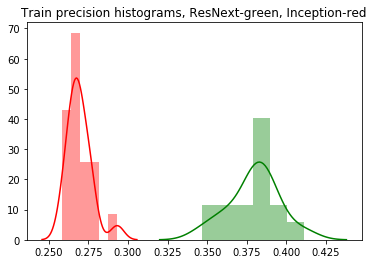

In [52]:
plt.title('Train precision histograms, ResNext-green, Inception-red')
sns.distplot(train_precision_k_list_inception, color = 'r');
sns.distplot(train_precision_k_list, color = 'g');

/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


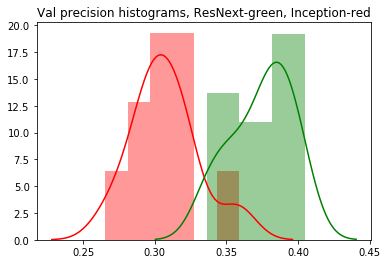

In [53]:
plt.title('Val precision histograms, ResNext-green, Inception-red')
sns.distplot(val_precision_k_list_inception, color = 'r');
sns.distplot(val_precision_k_list, color = 'g');

/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


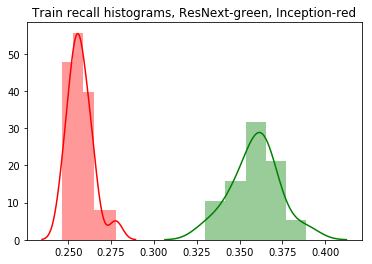

In [54]:
plt.title('Train recall histograms, ResNext-green, Inception-red')
sns.distplot(train_recall_k_list_inception, color = 'r');
sns.distplot(train_recall_k_list, color = 'g');

/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


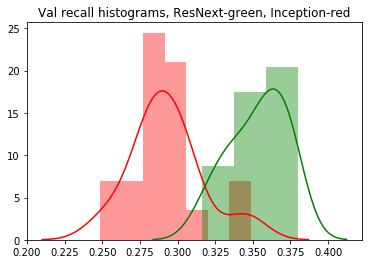

In [55]:
plt.title('Val recall histograms, ResNext-green, Inception-red')
sns.distplot(val_recall_k_list_inception, color = 'r');
sns.distplot(val_recall_k_list, color = 'g');